In [1]:
!conda install -y tensorflow-gpu"=>2.1.0"

Solving environment: | 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/linux-64::bkcharts==0.2=py36_0
  - defaults/noarch::dask==2.14.0=py_0
  - defaults/noarch::numpydoc==0.9.2=py_0
  - defaults/linux-64::pytest-arraydiff==0.3=py36h39e3cac_0
  - defaults/linux-64::bottleneck==1.3.2=py36heb32a55_0
  - defaults/linux-64::pywavelets==1.1.1=py36h7b6447c_0
  - defaults/noarch::pytest-astropy==0.8.0=py_0
  - defaults/linux-64::numexpr==2.7.1=py36h423224d_0
  - defaults/linux-64::h5py==2.10.0=py36h7918eee_0
  - defaults/linux-64::python-language-server==0.31.9=py36_0
  - defaults/linux-64::pandas==1.0.5=py36h0573a6f_0
  - defaults/linux-64::numpy-base==1.18.1=py36hde5b4d6_1
  - defaults/noarch::s3fs==0.4.0=py_0
  - defaults/linux-64::patsy==0.5.1=py36_0
  - defaults/linux-64::scikit-image==0.16.2=py36h0573a6f_0
  - defaults/linux-64::matplotlib-base==3.1.3=py36hef1b27d_0
  - defaults/linux-64::pytab

In [2]:
import matplotlib.pyplot as plt
from tensorflow.python.client import device_lib
device_lib.list_local_devices()
#check we have a GPU

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 16731017948770633793,
 name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 17949520181557759055
 physical_device_desc: "device: XLA_CPU device",
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 15625444416
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 188808611695794493
 physical_device_desc: "device: 0, name: Tesla V100-SXM2-16GB, pci bus id: 0000:00:1e.0, compute capability: 7.0",
 name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 16005182797510039582
 physical_device_desc: "device: XLA_GPU device"]

In [3]:
from dataset import PairedDatasetDouble
pd = PairedDatasetDouble('In/0', 'In/1', 'Out_New', 900)

Length of x_train 0 files: 943
Length of x_train 1 files: 943
Length of y_train files: 943
Item 0 with max: 3482 and min: -2180
Normalized item 0 with max: 1.0 and min: 0.0
Item 1 with max: 1681 and min: -1108
Normalized item 1 with max: 1.0 and min: 0.0
Item 2 with max: 5660 and min: -2212
Normalized item 2 with max: 1.0 and min: 0.0
Item 3 with max: 3564 and min: -1221
Normalized item 3 with max: 1.0 and min: 0.0
Item 4 with max: 3452 and min: -2218
Normalized item 4 with max: 1.0 and min: 0.0
Item 5 with max: 3378 and min: -2213
Normalized item 5 with max: 1.0 and min: 0.0
Item 6 with max: 3744 and min: -2186
Normalized item 6 with max: 1.0 and min: 0.0
Item 7 with max: 3495 and min: -2201
Normalized item 7 with max: 1.0 and min: 0.0
Item 8 with max: 1730 and min: -1078
Normalized item 8 with max: 1.0 and min: 0.0
Item 9 with max: 3420 and min: -1118
Normalized item 9 with max: 1.0 and min: 0.0
Item 10 with max: 3547 and min: -2167
Normalized item 10 with max: 1.0 and min: 0.0
Item 

In [5]:
!conda install -y keras

Solving environment: / 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/linux-64::bkcharts==0.2=py36_0
  - defaults/noarch::dask==2.14.0=py_0
  - defaults/linux-64::pytest-arraydiff==0.3=py36h39e3cac_0
  - defaults/linux-64::bottleneck==1.3.2=py36heb32a55_0
  - defaults/linux-64::pywavelets==1.1.1=py36h7b6447c_0
  - defaults/noarch::keras-preprocessing==1.1.0=py_1
  - defaults/noarch::pytest-astropy==0.8.0=py_0
  - defaults/linux-64::numexpr==2.7.1=py36h423224d_0
  - defaults/linux-64::h5py==2.10.0=py36h7918eee_0
  - defaults/linux-64::pandas==1.0.5=py36h0573a6f_0
  - defaults/linux-64::numpy-base==1.18.1=py36hde5b4d6_1
  - defaults/linux-64::tensorflow==2.2.0=gpu_py36hf933387_0
  - defaults/linux-64::tensorflow-gpu==2.2.0=h0d30ee6_0
  - defaults/linux-64::patsy==0.5.1=py36_0
  - defaults/linux-64::scikit-image==0.16.2=py36h0573a6f_0
  - defaults/linux-64::matplotlib-base==3.1.3=py36hef1b27d_0


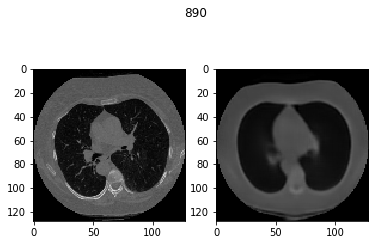

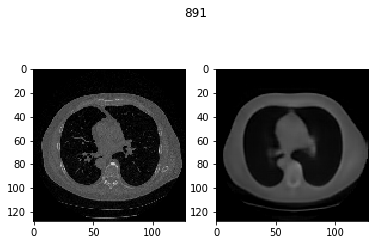

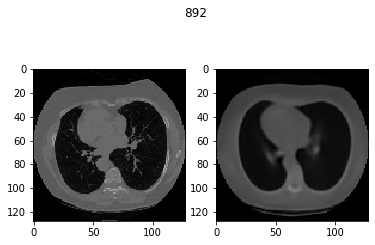

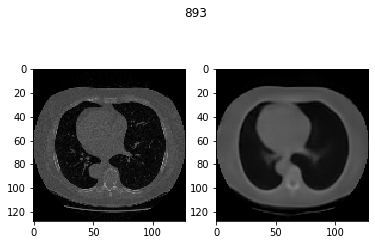

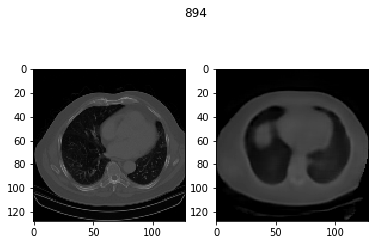

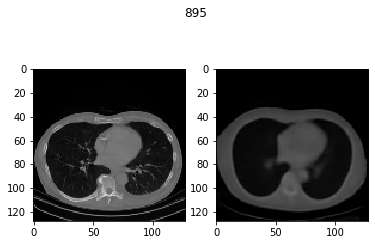

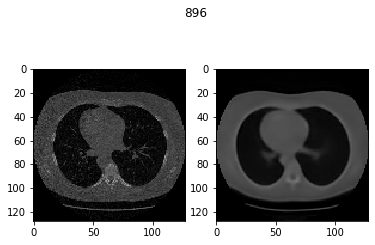

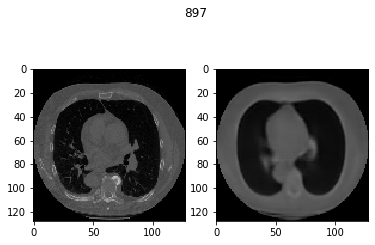

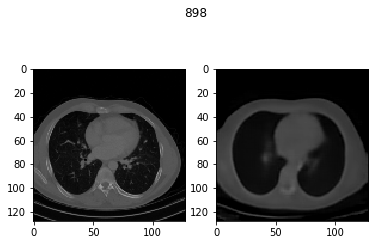

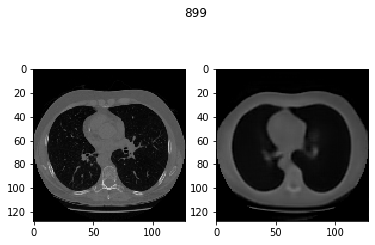

In [18]:
from keras.models import load_model
import matplotlib.pyplot as plt
import numpy as np

model = load_model('dual_model.hdf5')

for i in range(890, 900):
    
    input_1 = pd.x_train_0[i]
    input_2 = pd.x_train_1[i]
    
    input_1 = np.reshape(input_1, (1, 1024, 1024, 1))
    input_2 = np.reshape(input_2, (1, 1024, 1024, 1))
    
    out_1 = model.predict([input_1, input_2])
    
    out_1 = np.reshape(out_1, (128, 128, 128))
    
    truth = np.reshape(pd.y_train[i], (128, 128, 128))
    
    f = plt.figure()
    f.add_subplot(1, 2, 1)
    
    plt.imshow(truth[64], cmap = 'gray', vmin = 0, vmax = 1)
    
    f.add_subplot(1, 2, 2)
    
    plt.imshow(out_1[64], cmap = 'gray', vmin = 0, vmax = 1)
    
    plt.suptitle(i)
    plt.show()
    

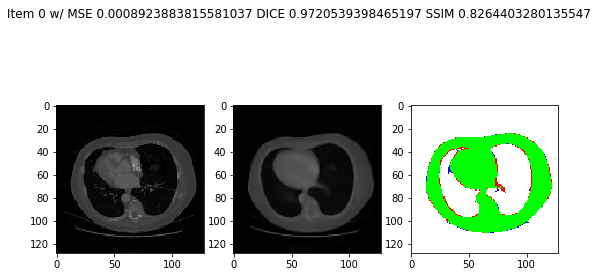

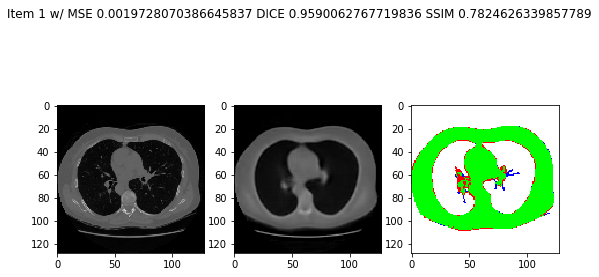

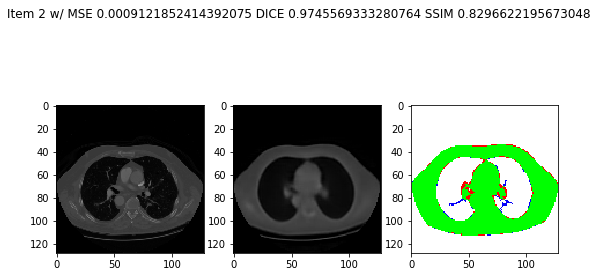

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/matplotlib/image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
<string>:6: UserWarning: Warning: converting a masked element to nan.
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/numpy/ma/core.py:722: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


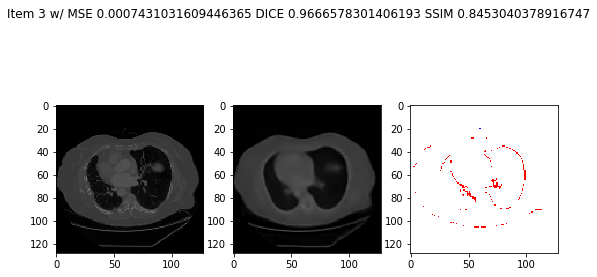

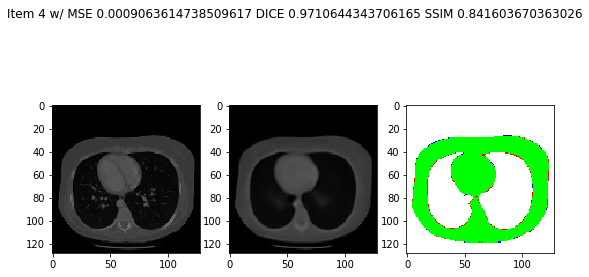

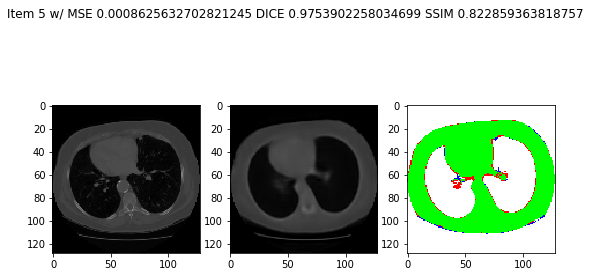

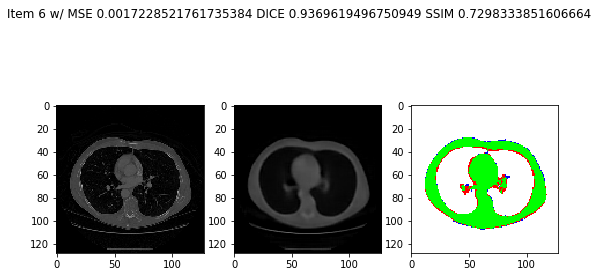

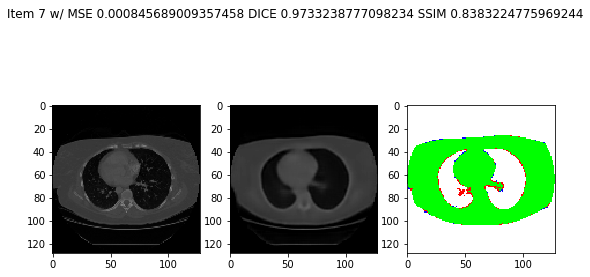

...

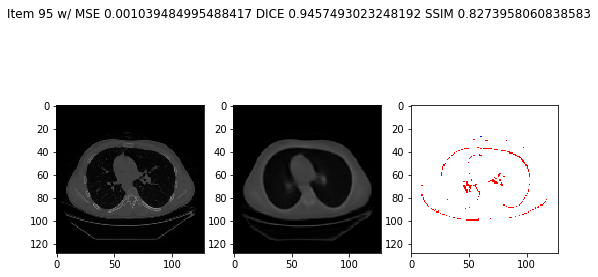

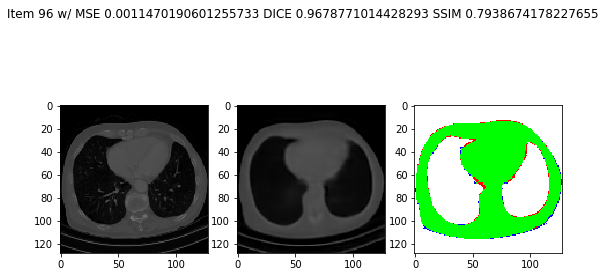

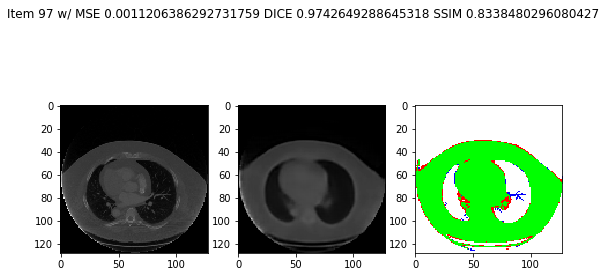

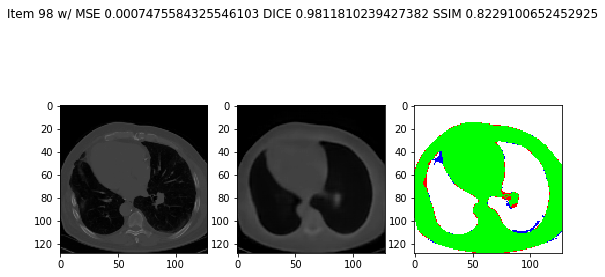

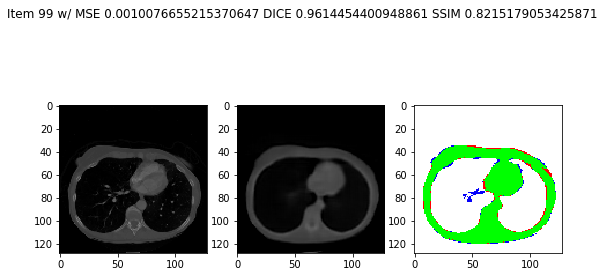

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import mean_squared_error
from skimage.metrics import structural_similarity
import cv2 as cv
import numpy.ma as ma

def dice_score(im1, im2, empty_score=1.0):
    """
    Computes the Dice coefficient, a measure of set similarity.
    Parameters
    ----------
    im1 : array-like, bool
        Any array of arbitrary size. If not boolean, will be converted.
    im2 : array-like, bool
        Any other array of identical size. If not boolean, will be converted.
    Returns
    -------
    dice : float
        Dice coefficient as a float on range [0,1].
        Maximum similarity = 1
        No similarity = 0
        Both are empty (sum eq to zero) = empty_score
        
    Notes
    -----
    The order of inputs for `dice` is irrelevant. The result will be
    identical if `im1` and `im2` are switched.
    """
    im1 = np.asarray(im1).astype(np.bool)
    im2 = np.asarray(im2).astype(np.bool)

    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    im_sum = im1.sum() + im2.sum()
    if im_sum == 0:
        return empty_score

    # Compute Dice coefficient
    intersection = np.logical_and(im1, im2)

    return 2. * intersection.sum() / im_sum

def extract_slice_mask(slice):

    ret, thresh = cv.threshold(slice, 0.1, 1, cv.THRESH_BINARY)
    num_labels, labels_im, stats, centroids = cv.connectedComponentsWithStats(thresh.astype('uint8'))

    max = stats[1, 4]
    largest_index = 1

    for k in np.delete(np.unique(labels_im), 0):

        size = stats[k, 4]
        if (size > max):

            max = size
            largest_index = k

    mask = ma.masked_not_equal(labels_im, largest_index)
    return mask

def extract_lung_mask(volume, size = 128):

    slices = []

    for i in range(0, size):

        masked_slice = extract_slice_mask(volume[i])
        slices.append(masked_slice)

    slices = np.array(slices)
    return slices

def tpfp(truth, prediction):

    h, w, l = truth.shape[0], truth.shape[1], truth.shape[2]

    tp = np.zeros(truth.shape)
    fp = np.zeros(truth.shape)
    fn = np.zeros(truth.shape)
    tn = np.zeros(truth.shape)

    truth_mask = extract_lung_mask(truth)
    pred_mask = extract_lung_mask(prediction)

    for i in range(0, h):

        for j in range(0, w):

            for k in range(0, l):

                if (truth_mask[i, j, k] == 1 and pred_mask[i, j, k] == 1):

                    tp[i, j, k] = 1

                elif (truth_mask[i, j, k] == 1 and pred_mask[i, j, k] == 0):

                    fn[i, j, k] = 1

                elif (truth_mask[i, j, k] == 0 and pred_mask[i, j, k] == 1):

                    fp[i, j, k] = 1

                else:

                    tn[i, j, k] = 1

    tp = ma.masked_values(tp * 100, 0)
    fp = ma.masked_values(fp * 50, 0)
    fn = ma.masked_values(fn, 0)
    
    prdd = pred_mask[64]
    trdd = truth_mask[64]

    #dice = np.sum(prdd[trdd==1])*2.0 / (np.sum(prdd) + np.sum(trdd))
    dice = dice_score(truth_mask, pred_mask)
    return tp, fp, fn, dice

mses = []
ssims = []
dices = []

for i in range(0, 100):
        
    original = np.reshape(pd.y_train[i], (128, 128, 128))
    input_1 = np.reshape(pd.x_train_0[i], (1, 1024, 1024, 1))
    input_2 = np.reshape(pd.x_train_1[i], (1, 1024, 1024, 1))
    output_1 = np.reshape(model.predict([input_1, input_2]), (128, 128, 128))
    
    mse = mean_squared_error(original, output_1)
    ssim = structural_similarity(original, output_1, data_range = 1)
    
    tp, fp, fn, dice = tpfp(original, output_1)
    f = plt.figure(figsize = (9, 5))
    
    f.add_subplot(1, 3, 1)
    plt.imshow(original[64], cmap = 'gray', vmin = 0, vmax = 1)
    
    f.add_subplot(1, 3, 2)
    plt.imshow(output_1[64], cmap = 'gray', vmin = 0, vmax = 1)
    
    f.add_subplot(1, 3, 3)
    plt.imshow(tp[64], cmap = 'brg', vmin = 0.1) #green
    plt.imshow(fp[64], cmap = 'brg', vmin = 0.1, vmax = 100) #red
    plt.imshow(fn[64], cmap = 'brg', vmin = 0.1, vmax = 90) #blue
    
    mses.append(mse)
    ssims.append(ssim)
    dices.append(dice)
    
    plt.suptitle("Item {} w/ MSE {} DICE {} SSIM {}".format(i, mse, dice, ssim))
    plt.show(block = True)

In [20]:
from statistics import mean

print(mean(mses))
print(mean(ssims))
print(mean(dices))

0.0010755618330610078
0.8080429207780593
0.9652856066206498


In [31]:
pd.prepare(890)

Shape of X0 - train: (890, 1024, 1024, 1)
Shape of X1 - train: (890, 1024, 1024, 1)
Shape of Y - train: (890, 128, 128, 128, 1)
Shape of X0 - val: (10, 1024, 1024, 1)
Shape of X1 - val: (10, 1024, 1024, 1)
Shape of Y - val: (10, 128, 128, 128, 1)


In [32]:
initial_epoch = 135
epochs = 200

history = model.fit([pd.x_train_0, pd.x_train_1], pd.y_train, batch_size = 1, epochs = epochs, validation_data = ([pd.x_val_0, pd.x_val_1], pd.y_val), initial_epoch = initial_epoch)

Epoch 136/200
890/890 [==============================] - 295s 331ms/step - loss: 0.0016 - val_loss: 0.0083
Epoch 137/200
890/890 [==============================] - 295s 332ms/step - loss: 0.0016 - val_loss: 0.0083
Epoch 138/200
890/890 [==============================] - 295s 331ms/step - loss: 0.0016 - val_loss: 0.0082
Epoch 139/200
890/890 [==============================] - 295s 331ms/step - loss: 0.0016 - val_loss: 0.0083
Epoch 140/200
890/890 [==============================] - 295s 331ms/step - loss: 0.0016 - val_loss: 0.0084
Epoch 141/200
890/890 [==============================] - 295s 332ms/step - loss: 0.0016 - val_loss: 0.0082
Epoch 142/200
890/890 [==============================] - 295s 332ms/step - loss: 0.0016 - val_loss: 0.0083
Epoch 143/200
890/890 [==============================] - 295s 332ms/step - loss: 0.0016 - val_loss: 0.0083
Epoch 144/200
890/890 [==============================] - 295s 332ms/step - loss: 0.0016 - val_loss: 0.0084
Epoch 145/200
890/890 [==============

In [33]:
model.save('dual_model_final.h5')

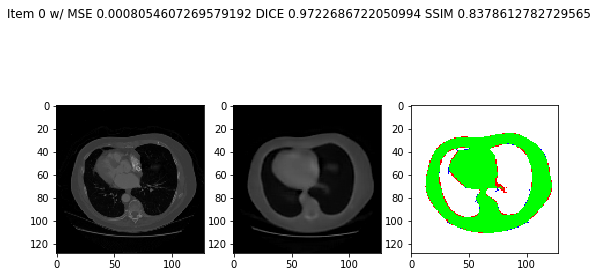

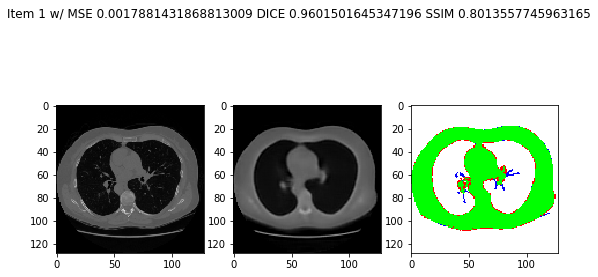

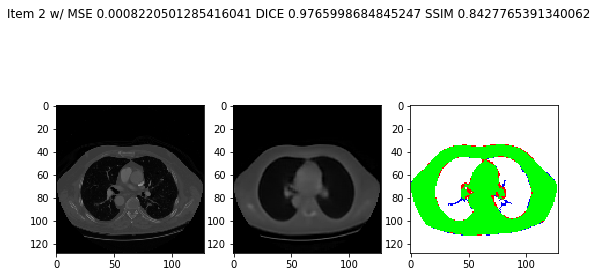

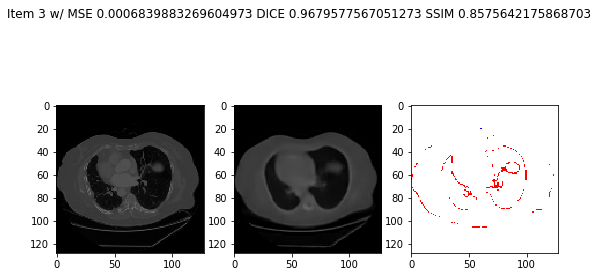

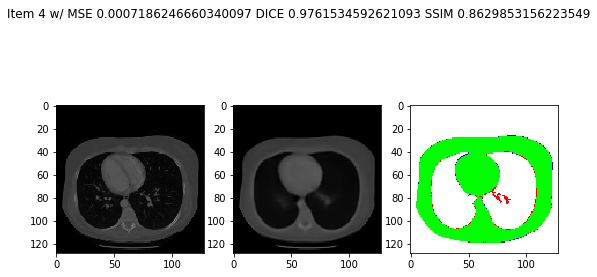

...

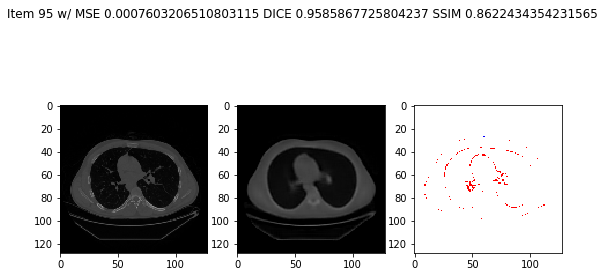

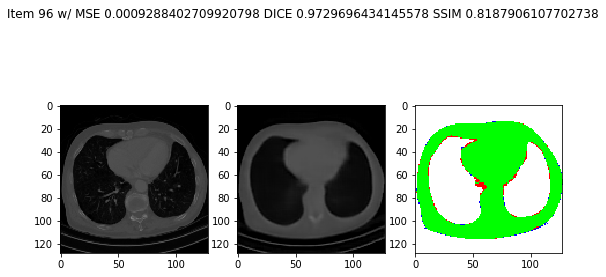

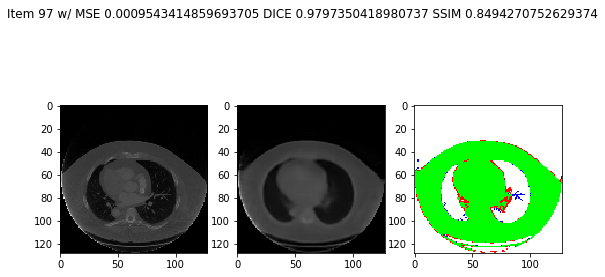

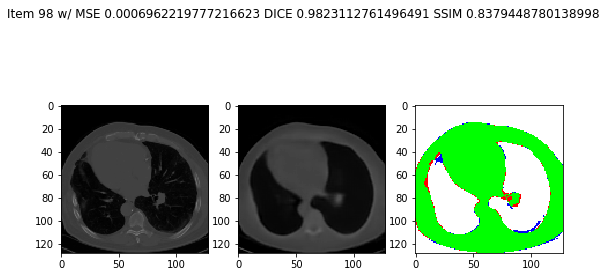

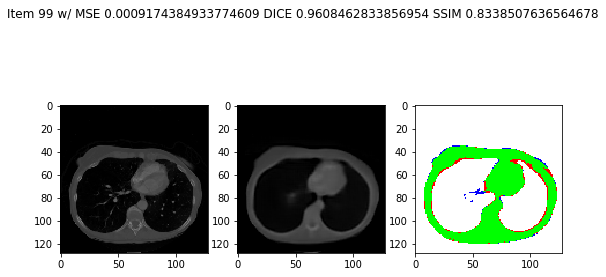

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import mean_squared_error
from skimage.metrics import structural_similarity
import cv2 as cv
import numpy.ma as ma

def dice_score(im1, im2, empty_score=1.0):
    """
    Computes the Dice coefficient, a measure of set similarity.
    Parameters
    ----------
    im1 : array-like, bool
        Any array of arbitrary size. If not boolean, will be converted.
    im2 : array-like, bool
        Any other array of identical size. If not boolean, will be converted.
    Returns
    -------
    dice : float
        Dice coefficient as a float on range [0,1].
        Maximum similarity = 1
        No similarity = 0
        Both are empty (sum eq to zero) = empty_score
        
    Notes
    -----
    The order of inputs for `dice` is irrelevant. The result will be
    identical if `im1` and `im2` are switched.
    """
    im1 = np.asarray(im1).astype(np.bool)
    im2 = np.asarray(im2).astype(np.bool)

    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    im_sum = im1.sum() + im2.sum()
    if im_sum == 0:
        return empty_score

    # Compute Dice coefficient
    intersection = np.logical_and(im1, im2)

    return 2. * intersection.sum() / im_sum

def extract_slice_mask(slice):

    ret, thresh = cv.threshold(slice, 0.1, 1, cv.THRESH_BINARY)
    num_labels, labels_im, stats, centroids = cv.connectedComponentsWithStats(thresh.astype('uint8'))

    max = stats[1, 4]
    largest_index = 1

    for k in np.delete(np.unique(labels_im), 0):

        size = stats[k, 4]
        if (size > max):

            max = size
            largest_index = k

    mask = ma.masked_not_equal(labels_im, largest_index)
    return mask

def extract_lung_mask(volume, size = 128):

    slices = []

    for i in range(0, size):

        masked_slice = extract_slice_mask(volume[i])
        slices.append(masked_slice)

    slices = np.array(slices)
    return slices

def tpfp(truth, prediction):

    h, w, l = truth.shape[0], truth.shape[1], truth.shape[2]

    tp = np.zeros(truth.shape)
    fp = np.zeros(truth.shape)
    fn = np.zeros(truth.shape)
    tn = np.zeros(truth.shape)

    truth_mask = extract_lung_mask(truth)
    pred_mask = extract_lung_mask(prediction)

    for i in range(0, h):

        for j in range(0, w):

            for k in range(0, l):

                if (truth_mask[i, j, k] == 1 and pred_mask[i, j, k] == 1):

                    tp[i, j, k] = 1

                elif (truth_mask[i, j, k] == 1 and pred_mask[i, j, k] == 0):

                    fn[i, j, k] = 1

                elif (truth_mask[i, j, k] == 0 and pred_mask[i, j, k] == 1):

                    fp[i, j, k] = 1

                else:

                    tn[i, j, k] = 1

    tp = ma.masked_values(tp * 100, 0)
    fp = ma.masked_values(fp * 50, 0)
    fn = ma.masked_values(fn, 0)
    
    prdd = pred_mask[64]
    trdd = truth_mask[64]

    #dice = np.sum(prdd[trdd==1])*2.0 / (np.sum(prdd) + np.sum(trdd))
    dice = dice_score(truth_mask, pred_mask)
    return tp, fp, fn, dice

mses = []
ssims = []
dices = []

for i in range(0, 100):
        
    original = np.reshape(pd.y_train[i], (128, 128, 128))
    input_1 = np.reshape(pd.x_train_0[i], (1, 1024, 1024, 1))
    input_2 = np.reshape(pd.x_train_1[i], (1, 1024, 1024, 1))
    output_1 = np.reshape(model.predict([input_1, input_2]), (128, 128, 128))
    
    mse = mean_squared_error(original, output_1)
    ssim = structural_similarity(original, output_1, data_range = 1)
    
    tp, fp, fn, dice = tpfp(original, output_1)
    f = plt.figure(figsize = (9, 5))
    
    f.add_subplot(1, 3, 1)
    plt.imshow(original[64], cmap = 'gray', vmin = 0, vmax = 1)
    
    f.add_subplot(1, 3, 2)
    plt.imshow(output_1[64], cmap = 'gray', vmin = 0, vmax = 1)
    
    f.add_subplot(1, 3, 3)
    plt.imshow(tp[64], cmap = 'brg', vmin = 0.1) #green
    plt.imshow(fp[64], cmap = 'brg', vmin = 0.1, vmax = 100) #red
    plt.imshow(fn[64], cmap = 'brg', vmin = 0.1, vmax = 90) #blue
    
    mses.append(mse)
    ssims.append(ssim)
    dices.append(dice)
    
    plt.suptitle("Item {} w/ MSE {} DICE {} SSIM {}".format(i, mse, dice, ssim))
    plt.show(block = True)

In [35]:
from statistics import mean

print(mean(mses))
print(mean(dices))
print(mean(ssims))

0.0009525999815192659
0.968213297295015
0.8241169669788232


In [37]:
y = model.history.history['val_loss']
plt.plot(y)
plt.show()

KeyError: 'val_loss'

In [ ]:
model.save_weights('double_weights.h5')

with open('double_arch.json', 'w') as f:
    
    f.write(model.to_json())